In [77]:
import random
import copy
from matplotlib import pyplot as plt
from matplotlib import animation
import numpy as np

In [78]:
MAX_GENERATIONS = 200
POSITION_MIN = -20
POSITION_MAX = 20
SCOUT_BEES_NUMBER = 10 
BEST_SITES_BEES_NUMBER = 5
SELECTED_SITES_BEES_NUMBER = 2
BEST_SITES_NUMBER = 2
SELECTED_SITES_NUMBER = 3
SITES_AREA_SIZE = 2

In [79]:
class F():
  def __init__(self):
    self.value = -1


class Bee(list):
  def __init__(self, *args):
    super().__init__(*args)
    self.f = F()

In [80]:
def beeCreator(x_pos_min=POSITION_MIN, x_pos_max=POSITION_MAX, y_pos_min=POSITION_MIN, y_pos_max=POSITION_MAX):
    x = random.uniform(x_pos_min, x_pos_max)
    y = random.uniform(y_pos_min, y_pos_max)
    return Bee([x, y])

def clone(bee):
    newBee=Bee(bee[:])
    newBee.f.value=bee.f.value
    return newBee

In [81]:
# Функция 
# f(x1,x2)=(x1+2*-x2+3)^2 + (2*x1+x2-8)^2
# def f(bee):
#   x,y = bee
#   f1=x+2*-y+3
#   f2=2*x+y-8
#   r = f1**2+f2**2
#   return r

def f(bee):
  x1,x2 = bee
  f1=(x1*x1+x2-11)**2
  f2=(x1+x2**2-7)**2
  r = f1+f2
  return r

In [82]:
# Постепенно уменьшается с каждой итерацией ( от 1+(1/MAX_GENERATIONS) до 0+(1/MAX_GENERATIONS) )
def calculate_iteration_koefficient(current_iteration):
  return 1-((current_iteration)/MAX_GENERATIONS)+(1/MAX_GENERATIONS)

In [83]:
# Функция инициализации новой популяции пчел-разведчиков
def scout_bees_init():
  scout_bees = []
  for i in range(SCOUT_BEES_NUMBER):
    scout_bees.append(beeCreator())
    scout_bees[i].f.value = f(scout_bees[i])
  return scout_bees

In [84]:
# Алгоритм пчелиной колонии
def bees_search():
  # Список пчел за одно поколение (чтобы потом выводить на график как менялось по поколениям)  
  bees_for_generation = []
  # Счетчик поколений
  generations_counter = 0
  # Список, хранящий всех пчел в текущем поколении
  bees = []
  while generations_counter < MAX_GENERATIONS:
    scout_bees = []
    best_sites = []
    selected_sites = []
    # Отправляем новую группу пчел-разведчиков
    scout_bees = scout_bees_init()
    # Добавляем эту группу пчел-разведчиков в общий список пчел
    for i in range(SCOUT_BEES_NUMBER):
      bees.append(clone(scout_bees[i])) 
    # Сохраняем популяцию пчел и статистику
    bees_for_generation.append(copy.deepcopy(bees))
    collect_and_print_statistics(bees, generations_counter)
    # Сортировка пчел по самой лучшей приспособленности (ищем минимум функции, следовательно сортировка по возрастанию)
    bees.sort(key=lambda bee: bee.f.value)
    # Находим лучшие и выбранные участки 
    for i in range(BEST_SITES_NUMBER):
      best_sites.append(clone(bees[i]))
    for i in range(SELECTED_SITES_NUMBER):
      selected_sites.append(clone(bees[BEST_SITES_NUMBER + i]))
    # Очищаем список всех пчел
    bees = []
    # Добавляем в список всех пчел тех пчел, которые являются лучшими и выбранными
    for i in range(BEST_SITES_NUMBER):
      bees.append(clone(best_sites[i]))
    for i in range(SELECTED_SITES_NUMBER):
      bees.append(clone(selected_sites[i]))
    # В каждый из этих участков отправляем пчел
    iter_koef = calculate_iteration_koefficient(generations_counter)
    for i in range(BEST_SITES_NUMBER):
      for j in range(BEST_SITES_BEES_NUMBER):
        bees.append(beeCreator(best_sites[i][0]-SITES_AREA_SIZE*iter_koef, best_sites[i][0]+SITES_AREA_SIZE*iter_koef,
                               best_sites[i][1]-SITES_AREA_SIZE*iter_koef, best_sites[i][1]+SITES_AREA_SIZE*iter_koef))
    for i in range(SELECTED_SITES_NUMBER):
      for j in range(SELECTED_SITES_BEES_NUMBER):
        bees.append(beeCreator(selected_sites[i][0]-SITES_AREA_SIZE*iter_koef, selected_sites[i][0]+SITES_AREA_SIZE*iter_koef,
                               selected_sites[i][1]-SITES_AREA_SIZE*iter_koef, selected_sites[i][1]+SITES_AREA_SIZE*iter_koef))
    # Рассчитываем значение функции для каждой пчелы в списке
    for i in range(len(bees)):
      bees[i].f.value = f(bees[i]) 

    generations_counter += 1

  return bees_for_generation

In [85]:
bestFunctionValues=[]
meanFunctionValues=[]
meanFunctionValuesWithoutScouts=[]

In [86]:
# Сохраняет и печатает статистику
def collect_and_print_statistics(bees, current_generation):
    best_bee = min(bees, key=lambda bee: bee.f.value)
    bees_function_values = [bees[i].f.value for i in range(len(bees))]
    meanFunctionValue = sum(bees_function_values)/len(bees)
    meanFunctionValueWithoutScouts = -1
    if(len(bees)>SCOUT_BEES_NUMBER):
      meanFunctionValueWithoutScouts = sum(bees_function_values[:-SCOUT_BEES_NUMBER])/(len(bees)-SCOUT_BEES_NUMBER)
    bestFunctionValues.append(best_bee.f.value)
    meanFunctionValues.append(meanFunctionValue)
    meanFunctionValuesWithoutScouts.append(meanFunctionValueWithoutScouts)
    print("Generation: ", current_generation)
    print("Best bee: ", best_bee)
    print("Best bee function value: ", best_bee.f.value)
    print('Average bees fuction value: ', meanFunctionValue)
    print('Average bees fuction value without scouts: ', meanFunctionValueWithoutScouts, "\n")

In [87]:
bees = bees_search()

Generation:  0
Best bee:  [-2.966941814029113, -1.0570089754338383]
Best bee function value:  88.90696937401523
Average bees fuction value:  44788.42034399441
Average bees fuction value without scouts:  -1 

Generation:  1
Best bee:  [-2.868742367465824, 1.0951151331730742]
Best bee function value:  77.96592913402786
Average bees fuction value:  33545.036118419834
Average bees fuction value without scouts:  11127.318559885349 

Generation:  2
Best bee:  [-4.249121572016127, -3.2593839160602074]
Best bee function value:  14.798258439410136
Average bees fuction value:  18966.746267300896
Average bees fuction value without scouts:  128.88235411979468 

Generation:  3
Best bee:  [-2.6771799892408827, 3.283599639675809]
Best bee function value:  1.5222052476850807
Average bees fuction value:  23517.130186070273
Average bees fuction value without scouts:  92.68357641284747 

Generation:  4
Best bee:  [-2.6771799892408827, 3.283599639675809]
Best bee function value:  1.5222052476850807
Averag

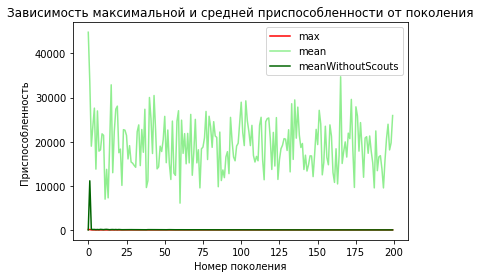

In [88]:
plt.plot(bestFunctionValues, color='red', label='max')
plt.plot(meanFunctionValues, color='lightgreen', label='mean')
plt.plot(meanFunctionValuesWithoutScouts, color='darkgreen', label='meanWithoutScouts')
meanFunctionValuesWithoutScouts
plt.xlabel('Номер поколения')
plt.ylabel('Приспособленность ')
plt.title('Зависимость максимальной и средней приспособленности от поколения')
plt.legend()
plt.show()

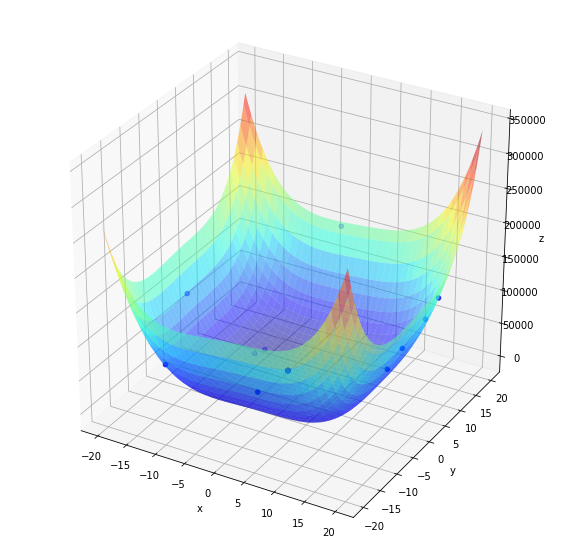

In [94]:
# Подготовка графика
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
x = np.linspace(-20, 20, 80)
y = np.linspace(-20, 20, 80)
X, Y = np.meshgrid(x, y)
Z= f([X,Y])
ax.plot_surface(X, Y, Z, cmap='jet', alpha=0.5)
# Другой вид отображения графика
#ax.plot_wireframe(X, Y, Z, color='r', linewidth=0.2)

# Хранит изображение
images = []

# Добавление изображения для каждого поколения
for t in range(len(bees)):
  image = ax.scatter3D([
                          bees[t][n][0] for n in range(len(bees[t]))],
                         [bees[t][n][1] for n in range(len(bees[t]))],
                         [f([bees[t][n][0],bees[t][n][1]]) for n in range(len(bees[t]))], c='b') 
  images.append([image])
# Сгенерировать изображение и сохранить
animated_image = animation.ArtistAnimation(fig, # фигура, где отображается анимация
    images,              # кадры
    interval=120,        # задержка между кадрами в мс
    blit=True,          # использовать ли двойную буферизацию
    repeat=True)       # зацикливать ли анимацию
# Потом нужно отдельно вызвать эту гиф, чтобы показать анимацию
animated_image.save('/content/bees.gif', writer='pillow') 

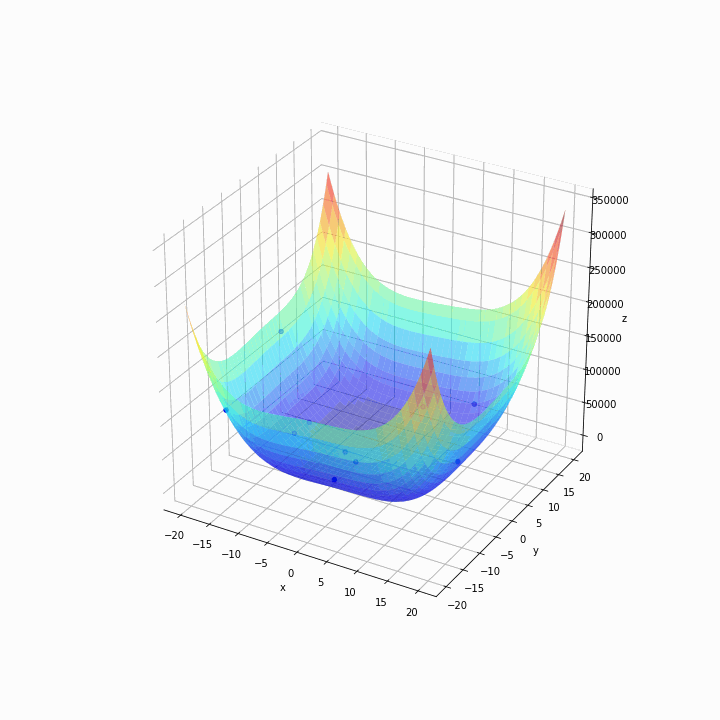

In [95]:
from IPython.display import Image

fname = '/content/bees.gif'
Image(open(fname, 'rb').read())